In this demo, we provide an example on how G-SAN can be used for stain augmentation and stain normalization.

First, load the pre-trained G-SAN generator model:

In [1]:
%matplotlib inline
import torch
import numpy as np
import random
from skimage import io, transform

from gsan.gsan import GSAN
from gsan.utils.misc import to_cuda
from gsan.utils.fdlutils import quick_imshow
from gsan.utils.visualization import tensor2im


weight_path = 'assets/weights.pt'

# # Prepare GAN
net_G = GSAN(K=3).to('cuda')
weights = torch.load(weight_path)

net_G.load_state_dict(weights)
net_G.eval()
for p in net_G.parameters():
    p.requires_grad = False


def imread_with_resize(fn, new_size):
    # channel last, 0 to 1
    img = io.imread(fn)
    img = img.astype(np.float32) / 255.0
    img = img[..., :3]
    # Pad the image to a minimal size
    new_shape = (max(256, new_size), max(256, new_size))
    img = transform.resize(img, new_shape)
    return img.transpose(2, 0, 1)

print("Loading successful!")


Loading successful!


Augment a cell image with random stains:

(<Figure size 3000x750 with 4 Axes>,
 array([<AxesSubplot: title={'center': 'Original'}>,
        <AxesSubplot: title={'center': 'Random'}>,
        <AxesSubplot: title={'center': 'Random'}>,
        <AxesSubplot: title={'center': 'Random'}>], dtype=object),
 (<matplotlib.image.AxesImage at 0x7f98ba025fa0>,
  <matplotlib.image.AxesImage at 0x7f98ba00bf40>))

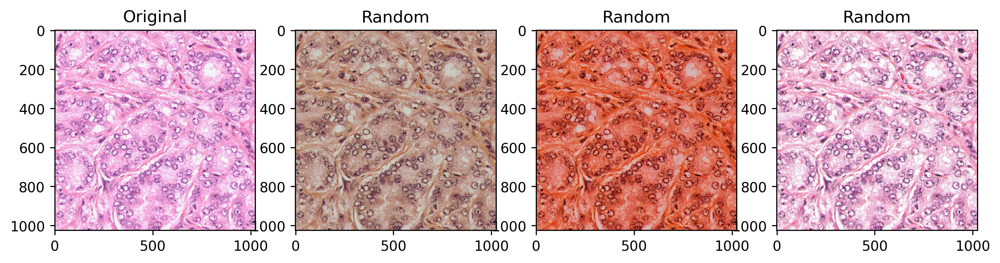

In [2]:
img_path = f'assets/{random.randint(1, 10)}.png'

# G-SAN expects (b, c, w, h), 0 to 1
input_img = imread_with_resize(img_path, new_size=1024)
# Repeat a couple times
n = 4
x = np.repeat(input_img[np.newaxis], n, axis=0)
x = to_cuda(torch.from_numpy(x))

with torch.no_grad():
    # Modify input level to use for a different magnification level
    # e.g. input_level=1 for 20x
    outputs_x = net_G.encode(x, input_level=0)
    outputs_x['sty'] = torch.randn_like(outputs_x['sty'])
    y = net_G.decode(outputs_x)

output_imgs = tensor2im(y, normalize=False)

quick_imshow(1, n, [input_img.transpose(1, 2, 0)] + output_imgs, colorbar=False,
              titles=['Original'] + ['Random'] * n, figsize=(12, 3))


Stain normalization: combine a morphology reference image and a stain reference image.

(<Figure size 2250x750 with 3 Axes>,
 array([<AxesSubplot: title={'center': 'Morphology Ref.'}>,
        <AxesSubplot: title={'center': 'Stain Ref.'}>,
        <AxesSubplot: title={'center': 'Output'}>], dtype=object),
 (<matplotlib.image.AxesImage at 0x7f98b46455b0>,
  <matplotlib.image.AxesImage at 0x7f98b46ac1c0>))

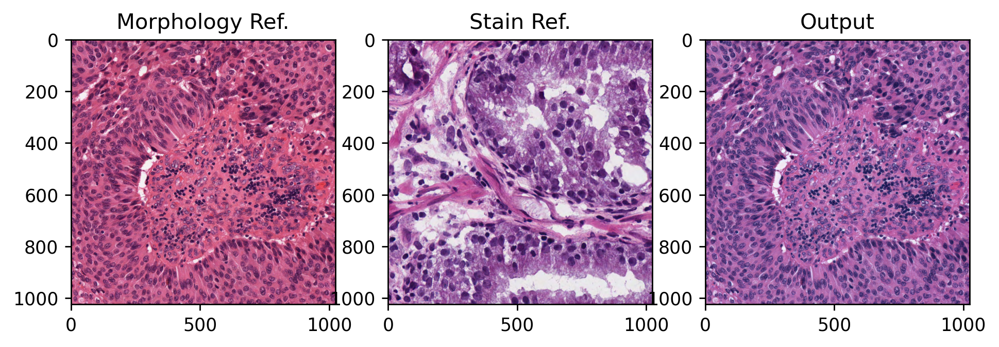

In [3]:
img_path = f'assets/{random.randint(1, 10)}.png'
ref_path = f'assets/{random.randint(1, 10)}.png'

input_img = imread_with_resize(img_path, new_size=1024)
x = torch.from_numpy(input_img[np.newaxis])
x = to_cuda(x)

ref_img = imread_with_resize(ref_path, new_size=1024)
r = torch.from_numpy(ref_img[np.newaxis])
r = to_cuda(r)

with torch.no_grad():
    # Encode content from input
    outputs_x = net_G.encode(x)

    # Encode stain from ref
    outputs_r = net_G.encode(r)

    # Combine content and style
    inputs_y = outputs_x
    inputs_y['sty'] = outputs_r['sty']
    y = net_G.decode(inputs_y)

output_imgs = tensor2im(y, normalize=False)

quick_imshow(1, 3, [input_img.transpose(1, 2, 0), ref_img.transpose(1, 2, 0)] + output_imgs, colorbar=False, titles=['Morphology Ref.', 'Stain Ref.', 'Output'], figsize=(9, 3))


Show the generated band-pass images by G-SAN.

(<Figure size 3000x750 with 4 Axes>,
 array([<AxesSubplot: title={'center': 'Augmented'}>,
        <AxesSubplot: title={'center': 'Output Band-Pass at k = 0'}>,
        <AxesSubplot: title={'center': 'Output Band-Pass at k = 1'}>,
        <AxesSubplot: title={'center': 'Output Band-Pass at k = 2'}>],
       dtype=object),
 (<matplotlib.image.AxesImage at 0x7f98b442d310>,
  <matplotlib.image.AxesImage at 0x7f98b4406760>))

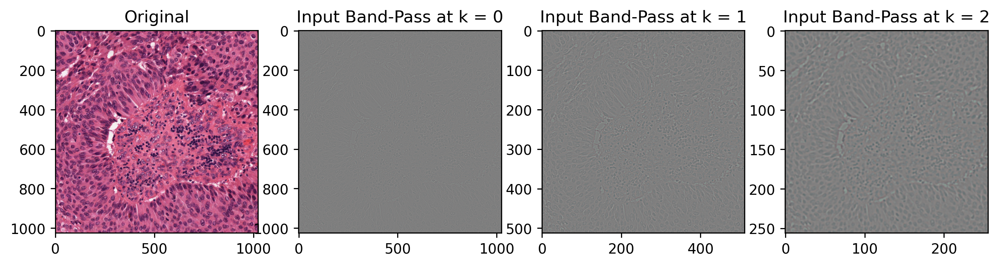

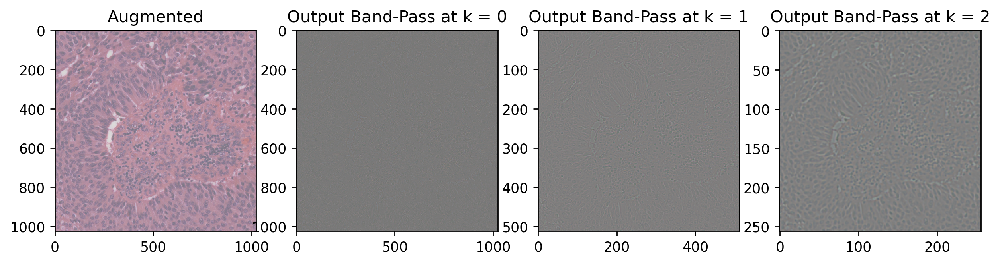

In [4]:
img_path = f'assets/{random.randint(1, 10)}.png'

# G-SAN expects (b, c, w, h), 0 to 1
input_img = imread_with_resize(img_path, new_size=1024)
x = input_img[np.newaxis]
x = to_cuda(torch.from_numpy(x))

with torch.no_grad():
    outputs_x = net_G.encode(x)
    outputs_x['sty'] = torch.randn_like(outputs_x['sty'])
    outputs_y = net_G.decode(outputs_x, training=True)

# The augmented image
y = outputs_y['g'][0]
y = tensor2im(y[0])

# The Laplacian pyramids
lp_x = outputs_x['p']
lp_y = outputs_y['p']
lp_x = [tensor2im(t[0]) for t in lp_x]
lp_y = [tensor2im(t[0]) for t in lp_y]

quick_imshow(1, net_G.K + 1, [input_img.transpose(1, 2, 0)] + lp_x, colorbar=False,
             titles=['Original'] + [f'Input Band-Pass at k = {k}' for k in range(net_G.K)], figsize=(12, 3))
quick_imshow(1, net_G.K + 1, [y] + lp_y, colorbar=False,
             titles=['Augmented'] + [f'Output Band-Pass at k = {k}' for k in range(net_G.K)], figsize=(12, 3))